In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy
%matplotlib inline

In [2]:
names = open("names.txt", "r").read().splitlines()
print(f"We have {len(names)} names and the first 8 are: {names[:8]}")

We have 32033 names and the first 8 are: ['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']


In [3]:
vocabulary = sorted(list(set("".join(names))))
stoi = {s: i+1 for i, s in enumerate(vocabulary)}
stoi["."] = 0
itos = {i: s for s, i in stoi.items()}

In [4]:
contextLength = 3
def buildDataset(words, contextLength):
    X, Y = [], [] # has to be ints not chars
    for word in words:
        context = [0] * contextLength
        for char in word + ".":
            y_context = stoi[char]
            X.append(context)
            Y.append(y_context)
            print(f"{''.join(itos[i] for i in context)} ---> {itos[y_context]}")
            context = context[1:] + [y_context]
    X = torch.tensor(X)
    Y = torch.tensor(Y)
    print(f"Returning X of shape {X.shape} and Y of shapre {Y.shape}")
    return X, Y

import random
random.shuffle(names)
split = int(0.8*len(names))
Xtr, Ytr = buildDataset(names[:split], contextLength)
Xval, Yval = buildDataset(names[split:], contextLength)

... ---> d
..d ---> a
.da ---> l
dal ---> e
ale ---> y
ley ---> z
eyz ---> a
yza ---> .
... ---> h
..h ---> a
.ha ---> y
hay ---> l
ayl ---> e
yle ---> n
len ---> .
... ---> f
..f ---> a
.fa ---> r
far ---> i
ari ---> h
rih ---> a
iha ---> .
... ---> z
..z ---> a
.za ---> f
zaf ---> i
afi ---> r
fir ---> .
... ---> c
..c ---> r
.cr ---> a
cra ---> y
ray ---> t
ayt ---> o
yto ---> n
ton ---> .
... ---> h
..h ---> a
.ha ---> s
has ---> l
asl ---> e
sle ---> y
ley ---> .
... ---> m
..m ---> a
.ma ---> n
man ---> a
ana ---> m
nam ---> i
ami ---> .
... ---> d
..d ---> e
.de ---> l
del ---> a
ela ---> y
lay ---> l
ayl ---> a
yla ---> .
... ---> n
..n ---> a
.na ---> m
nam ---> i
ami ---> .
... ---> k
..k ---> i
.ki ---> y
kiy ---> a
iya ---> n
yan ---> n
ann ---> a
nna ---> .
... ---> b
..b ---> l
.bl ---> u
blu ---> m
lum ---> a
uma ---> .
... ---> c
..c ---> a
.ca ---> m
cam ---> b
amb ---> r
mbr ---> i
bri ---> .
... ---> e
..e ---> z
.ez ---> r
ezr ---> a
zra ---> .
... ---> r
..r ---> e

In [5]:
vocabEmbeddingSize = 10
C = torch.randn((len(stoi.items()), 10))
W1 = torch.randn((vocabEmbeddingSize*contextLength, 200))
b1 = torch.randn(200)
W2 = torch.randn((200, 27))
b2 = torch.randn(27)
parameters = [C, W1, b1, W2, b2]

In [6]:
sum(p.nelement() for p in parameters) # number of parameters in total

11897

In [7]:
for p in parameters:
  p.requires_grad = True

In [13]:
loss_i = []
step_i = []
batchSize = 32
for i in range(100000):
    batchIndexes = torch.randint(0, Xtr.shape[0], (batchSize,))
    
    # forward pass
    embeddings = C[Xtr[batchIndexes]]
    layer1tanh = torch.tanh(embeddings.view(-1, vocabEmbeddingSize*contextLength) @ W1 + b1)
    logits = layer1tanh @ W2 + b2
    loss = F.cross_entropy(logits, Ytr[batchIndexes])
    print(f"Loss for this batch: {loss.item()}")

    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()

    # update params
    lr = 0.01
    for p in parameters:
        p.data += -lr * p.grad

    # track stats
    step_i.append(i)
    loss_i.append(loss.log10().item())

Loss for this batch: 2.7410826683044434
Loss for this batch: 2.2163374423980713
Loss for this batch: 2.3612966537475586
Loss for this batch: 2.5686402320861816
Loss for this batch: 1.9308052062988281
Loss for this batch: 2.2923121452331543
Loss for this batch: 1.9208722114562988
Loss for this batch: 2.529710292816162
Loss for this batch: 2.3129448890686035
Loss for this batch: 2.667921543121338
Loss for this batch: 2.0262272357940674
Loss for this batch: 2.4273831844329834
Loss for this batch: 2.475175619125366
Loss for this batch: 2.3711767196655273
Loss for this batch: 2.3550755977630615
Loss for this batch: 1.9749094247817993
Loss for this batch: 2.2117979526519775
Loss for this batch: 2.1854419708251953
Loss for this batch: 2.1787235736846924
Loss for this batch: 2.1870334148406982
Loss for this batch: 2.2766244411468506
Loss for this batch: 2.242042064666748
Loss for this batch: 2.5313026905059814
Loss for this batch: 2.2826828956604004
Loss for this batch: 2.537938356399536
Loss 

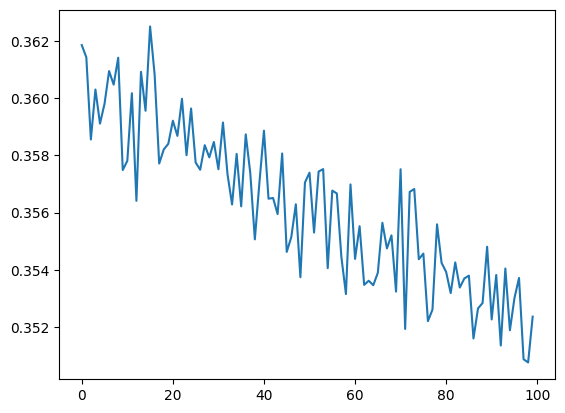

In [18]:
plt.plot(torch.tensor(loss_i).view(-1, 1000).mean(1))

In [15]:
# Training loss
embeddings = C[Xtr]
layer1tanh = torch.tanh(embeddings.view(-1, vocabEmbeddingSize*contextLength) @ W1 + b1)
logits = layer1tanh @ W2 + b2
loss = F.cross_entropy(logits, Ytr)
loss

tensor(2.2596, grad_fn=<NllLossBackward0>)

In [16]:
# Validation loss
embeddings = C[Xval]
layer1tanh = torch.tanh(embeddings.view(-1, vocabEmbeddingSize*contextLength) @ W1 + b1)
logits = layer1tanh @ W2 + b2
loss = F.cross_entropy(logits, Yval)
loss

tensor(2.2844, grad_fn=<NllLossBackward0>)

In [17]:
# sample from the model
for _ in range(20):
    
    out = []
    context = [0] * contextLength # initialize with all ...
    while True:
      embeddings = C[torch.tensor([context])] # (1,block_size,d)
      layer1tanh = torch.tanh(embeddings.view(1, -1) @ W1 + b1)
      logits = layer1tanh @ W2 + b2
      probs = F.softmax(logits, dim=1)
      ix = torch.multinomial(probs, num_samples=1).item()
      context = context[1:] + [ix]
      out.append(ix)
      if ix == 0:
        break
    
    print(''.join(itos[i] for i in out))

aziah.
dali.
asi.
chira.
kio.
chetianadaagwyanlee.
enesiah.
mizaura.
gaudamsya.
laizan.
amyna.
mickaless.
myna.
elit.
kijaise.
khalinadon.
jashie.
paviuiannai.
sia.
jzeer.
